# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and make changes there. __DO NOT__ request access to this tutorial.


# Install detectron2

In [ ]:
!sudo apt-get install python3.7
!sudo apt-get update -y
!sudo update-alternatives --install /usr/bin/python3 python3
/user/bin/python3.7.1
!sudo update-alternatives --config python3

SyntaxError: ignored

In [ ]:
!pip install pyyaml==5.1
# workaround: install old version of pytorch since detectron2 hasn't released packages for pytorch 1.9 (issue: https://github.com/facebookresearch/detectron2/issues/3158)
#!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html
!pip install torch==1.11.0+cu113 torchvision==0.11.1+cu113 torchaudio===0.11.0+cu113 -f https://download.pytorch.org/whl/cu113/torch_stable.html
# install detectron2 that matches pytorch 1.8


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 10.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp310-cp310-linux_x86_64.whl size=44090 sha256=1fb6f980356ce5af684a62de1fc1970b19ec5e00cec844f4761e494491e815d6
  Stored in directory: /root/.cache/pip/wheels/70/83/31/975b737609aba39a4099d471d5684141c1fdc3404f97e7f68a
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flax 0.6.9 requires PyYAML>=5.4.1, but you have pyyaml 5.1 which is incompatible.
dask 2022.12.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatibl

In [ ]:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

In [ ]:
!python --version

Python 3.10.11


In [ ]:
# check pytorch installation:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.8")   # please manually install torch 1.8 if Colab changes its default version

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/detectFish_v6.zip"

Archive:  /content/drive/MyDrive/detectFish_v6.zip
   creating: detectFish_v6/images/
  inflating: detectFish_v6/images/00006.png  
  inflating: detectFish_v6/images/00025.png  
  inflating: detectFish_v6/images/00047.png  
  inflating: detectFish_v6/images/00083.png  
  inflating: detectFish_v6/images/00137.png  
  inflating: detectFish_v6/images/00151.png  
  inflating: detectFish_v6/images/00186.png  
  inflating: detectFish_v6/images/00205.png  
  inflating: detectFish_v6/images/00225.png  
  inflating: detectFish_v6/images/00246.png  
  inflating: detectFish_v6/images/00248.png  
  inflating: detectFish_v6/images/00292.png  
  inflating: detectFish_v6/images/00310.png  
  inflating: detectFish_v6/images/00312.png  
  inflating: detectFish_v6/images/00367.png  
  inflating: detectFish_v6/images/00383.png  
  inflating: detectFish_v6/images/00400.png  
  inflating: detectFish_v6/images/00424.png  
  inflating: detectFish_v6/images/00426.png  
  inflating: detectFish_v6/images/00435.

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("traindata1",{},"/content/detectFish_v6/trainval.json","/content/detectFish_v6/images")

In [ ]:
sample_metaadata=MetadataCatalog.get("traindata1")
dataset_dicts=DatasetCatalog.get("traindata1")

[11/29 05:57:23 d2.data.datasets.coco]: Loaded 830 images in COCO format from /content/detectFish_v6/trainval.json


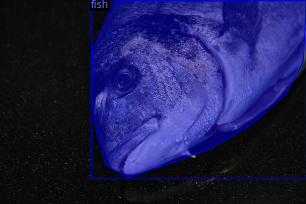

In [ ]:
import random
#if True:
for d in random.sample(dataset_dicts, 1):
  img=cv2.imread(d["file_name"])
    #img = cv2.imread('/content/my_custom_dataset/images/COCO_val2014_000000000074.jpg')
  visualizer = Visualizer(img[:, :, ::-1], metadata=sample_metaadata, scale=0.5)
  vis = visualizer.draw_dataset_dict(d)
  cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("traindata1",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0002  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[11/29 05:57:37 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:07, 23.3MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[11/29 05:57:52 d2.engine.train_loop]: Starting training from iteration 0
[11/29 05:58:03 d2.utils.events]:  eta: 0:08:18  iter: 19  total_loss: 1.784  loss_cls: 0.6195  loss_box_reg: 0.4496  loss_mask: 0.6914  loss_rpn_cls: 0.005032  loss_rpn_loc: 0.009472  time: 0.5086  data_time: 0.0734  lr: 3.9962e-06  max_mem: 2756M
[11/29 05:58:13 d2.utils.events]:  eta: 0:08:01  iter: 39  total_loss: 1.792  loss_cls: 0.5934  loss_box_reg: 0.503  loss_mask: 0.6817  loss_rpn_cls: 0.004778  loss_rpn_loc: 0.01239  time: 0.5020  data_time: 0.0554  lr: 7.9922e-06  max_mem: 2756M
[11/29 05:58:23 d2.utils.events]:  eta: 0:07:44  iter: 59  total_loss: 1.652  loss_cls: 0.5138  loss_box_reg: 0.4453  loss_mask: 0.6652  loss_rpn_cls: 0.0041  loss_rpn_loc: 0.01781  time: 0.4952  data_time: 0.0490  lr: 1.1988e-05  max_mem: 2756M
[11/29 05:58:32 d2.utils.events]:  eta: 0:07:24  iter: 79  total_loss: 1.696  loss_cls: 0.4539  loss_box_reg: 0.5959  loss_mask: 0.6428  loss_rpn_cls: 0.005593  loss_rpn_loc: 0.01222  

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  # set a custom testing threshold
cfg.DATASETS.TEST=("traindata1",)
predictor = DefaultPredictor(cfg)

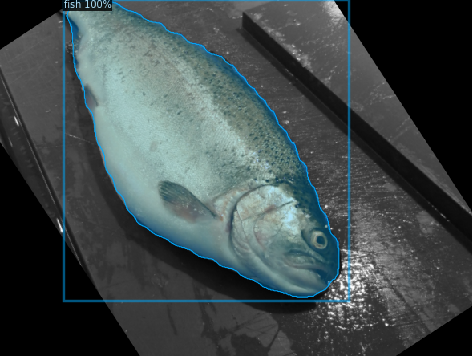

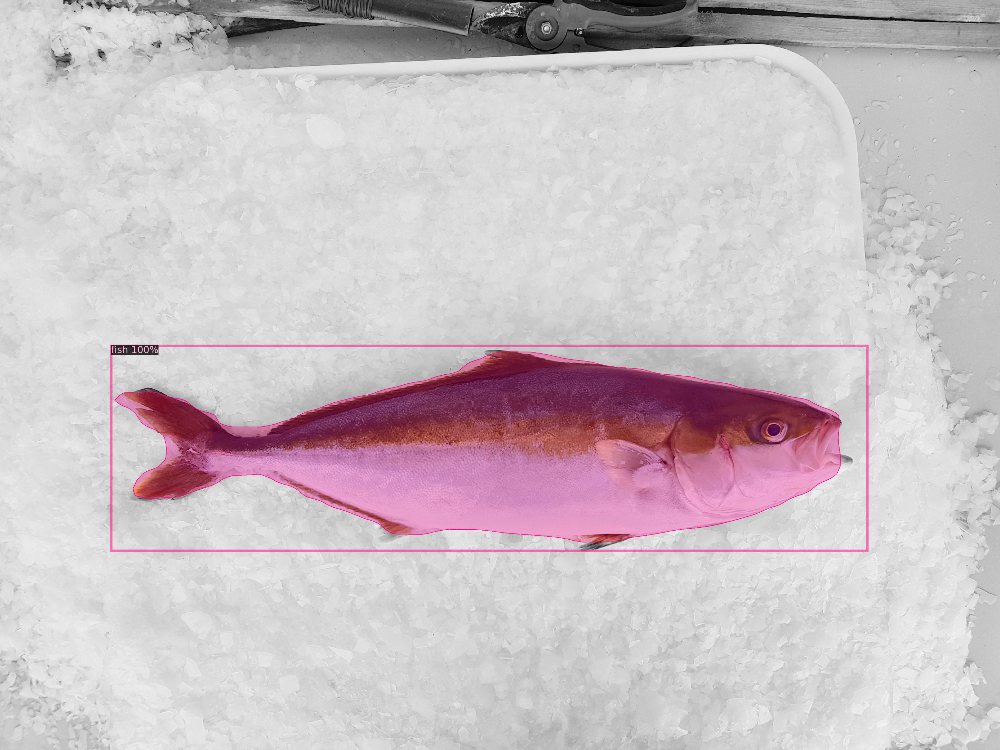

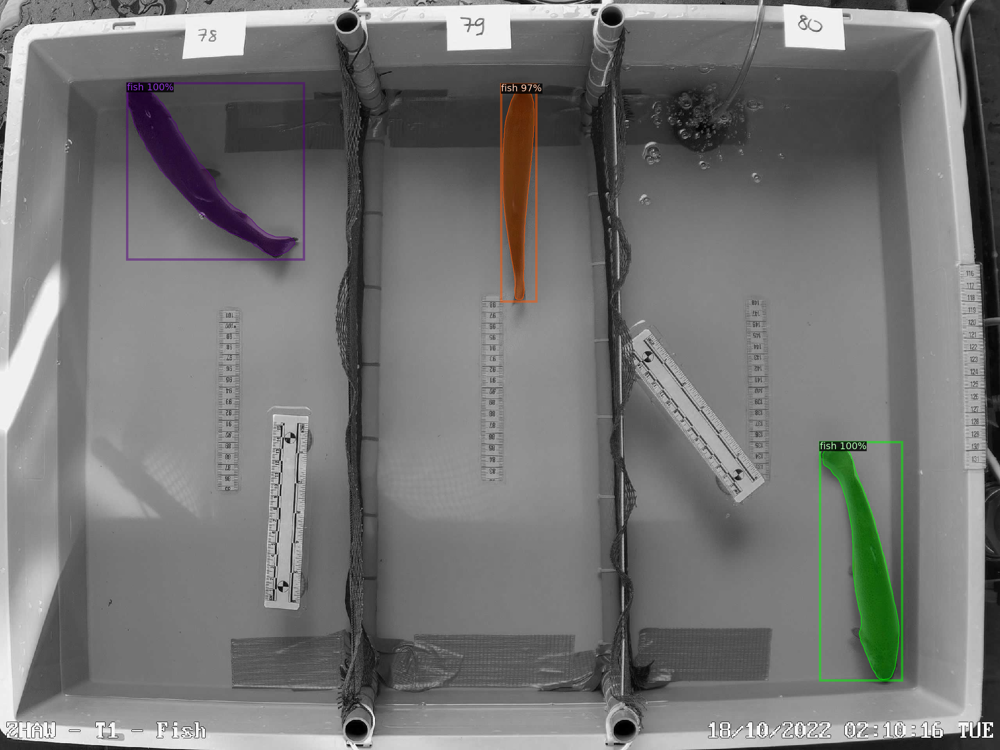

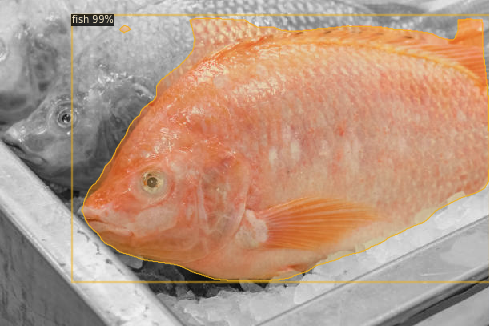

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts, 4):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=sample_metaadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

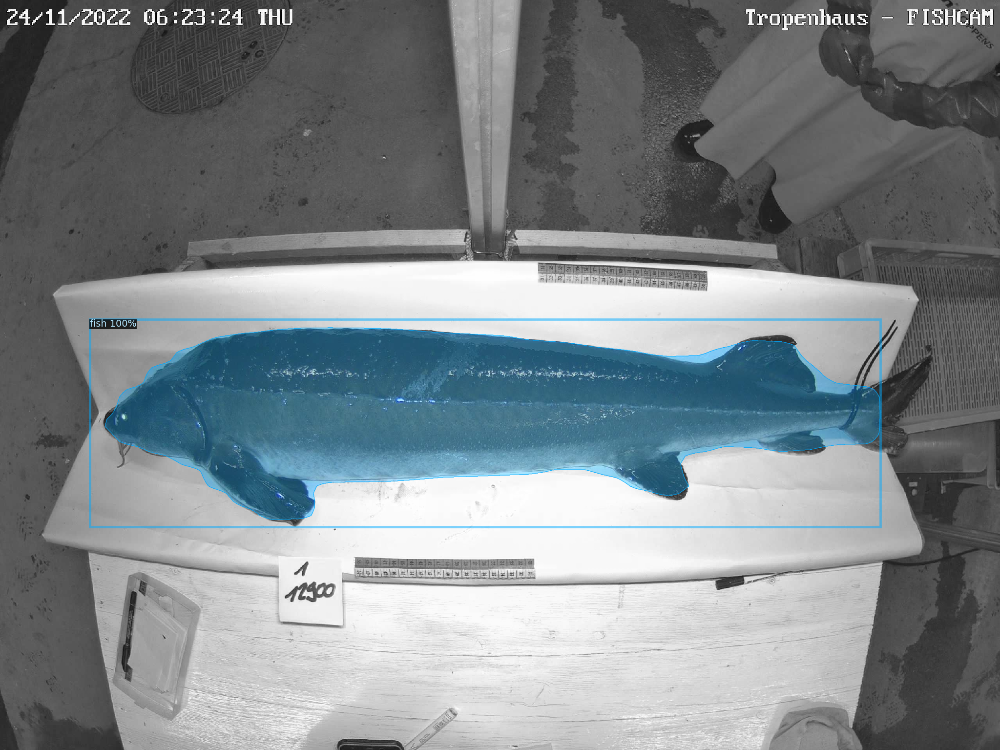

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts, 1):
    im = cv2.imread("/content/Tropenhaus - FISHCAM_00_20221124062324.jpg")
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=sample_metaadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
#THE ENDDDDDDD

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("traindata1", ("bbox", "segm"), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "traindata1")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

[09/06 10:52:17 d2.data.datasets.coco]: Loaded 706 images in COCO format from /content/detectFish_v4/trainval.json
[09/06 10:52:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/06 10:52:17 d2.data.common]: Serializing 706 elements to byte tensors and concatenating them all ...
[09/06 10:52:18 d2.data.common]: Serialized dataset takes 0.73 MiB
[09/06 10:52:18 d2.evaluation.evaluator]: Start inference on 706 batches
[09/06 10:52:19 d2.evaluation.evaluator]: Inference done 11/706. Dataloading: 0.0013 s/iter. Inference: 0.1049 s/iter. Eval: 0.0013 s/iter. Total: 0.1075 s/iter. ETA=0:01:14
[09/06 10:52:24 d2.evaluation.evaluator]: Inference done 29/706. Dataloading: 0.0540 s/iter. Inference: 0.1099 s/iter. Eval: 0.0786 s/iter. Total: 0.2426 s/iter. ETA=0:02:44
[09/06 10:52:29 d2.evaluation.evaluator]: Inference done 35/706. Dataloading: 0.0624 s/iter. Inference: 0.1160 s/

KeyboardInterrupt: ignored

In [ ]:
!unzip "/content/drive/MyDrive/test_detectv3.zip"

unzip:  cannot find or open /content/drive/MyDrive/test_detectv3.zip, /content/drive/MyDrive/test_detectv3.zip.zip or /content/drive/MyDrive/test_detectv3.zip.ZIP.


In [ ]:
#import the COCO Evaluator to use the COCO Metrics
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.data import build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

#register your data
#register_coco_instances("my_dataset_train", {}, "/code/detectron2/detectron2/instances_train2017.json", "/code/detectron2/detectron2/train2017")
#register_coco_instances("my_dataset_val", {}, "/code/detectron2/detectron2/instances_val2017.json", "/code/detectron2/detectron2/val2017")
register_coco_instances("my_dataset_test", {}, "/code/detectron2/detectron2/instances_test2017.json", "/code/detectron2/detectron2/test2017")

#load the config file, configure the threshold value, load weights
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
#cfg.merge_from_file("/code/detectron2/detectron2/output/custom_mask_rcnn_X_101_32x8d_FPN_3x_Iteration_3_dataset.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"

# Create predictor
predictor = DefaultPredictor(cfg)

#Call the COCO Evaluator function and pass the Validation Dataset
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")

#Use the created predicted model in the previous step
inference_on_dataset(predictor.model, val_loader, evaluator)

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("balloon_val", ("bbox", "segm"), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "balloon_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[07/08 22:50:43 d2.evaluation.coco_evaluation]: 'balloon_val' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[07/08 22:50:43 d2.data.datasets.coco]: Converting annotations of dataset 'balloon_val' to COCO format ...)
[07/08 22:50:43 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[07/08 22:50:43 d2.data.datasets.coco]: Conversion finished, #images: 13, #annotations: 50
[07/08 22:50:43 d2.data.datasets.coco]: Caching COCO format annotations at './output/balloon_val_coco_format.json' ...
[07/08 22:50:44 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  balloon   | 50           |
|            |              |
[07/08 22:50:44 d2.data.common]: Serializing 13 elements to byte tensors and concatenating them all ...
[07/08 22:50:44 d2.data.common]: Serialized dataset takes 0.04 MiB
[07/08 22:50:44 d2.data.dataset_mapper]: Augmentations used in trai

OrderedDict([('bbox',
              {'AP': 66.7575984802854,
               'AP50': 84.71906024215401,
               'AP75': 79.6850976022887,
               'APl': 79.51426848548515,
               'APm': 54.933394319629045,
               'APs': 23.917443214909724}),
             ('segm',
              {'AP': 76.79883944079043,
               'AP50': 84.20295316611471,
               'AP75': 83.95779282808186,
               'APl': 93.57150630750836,
               'APm': 56.50588544163433,
               'APs': 5.8381956414264895})])

###**Inference using the Trained Model**

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("skin_test", )
predictor = DefaultPredictor(cfg)

In [ ]:
# save it as a h5 file

from tensorflow.keras.models import load_model

model.save('specie_classification_inception.h5')

In [ ]:
test_dataset_dicts = get_data_dicts(data_path+'test', classes)

In [ ]:
for d in random.sample(test_dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    v = Visualizer(img[:, :, ::-1],
                   metadata=microcontroller_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW # removes the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()